This report reviews the work of :Chawan, P., & Chaudhari, S. (2018). Logistic regression and SVM-based diabetes prediction system. ResearchGate. https://www.researchgate.net/profile/Pramila-Chawan/publication/326416823_LOGISTIC_REGRESSION_AND_SVM_BASED_DIABETES_PREDICTION_SYSTEM/links/5b4c80ddaca272c60947858a/LOGISTIC-REGRESSION-AND-SVM-BASED-DIABETES-PREDICTION-SYSTEM.pdf


# **1-Preprocessing**

In [1]:
!pip install xgboost
!pip install lime
!pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 15.8 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 2.8.8
    Uninstalling networkx-2.8.8:
      Successfully uninstalled networkx-2.8.8
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pyartemis 0.1.5 requires networkx<3.0.0,>=2.8.8, but you have networkx 3.4.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cuda-cupti-cu12 12.5.82 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-nvrtc-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, f1_score, roc_auc_score
from imblearn.over_sampling import ADASYN
import xgboost as xgb
import lime
import lime.lime_tabular
import shap
from sklearn.impute import SimpleImputer


In [3]:
df=pd.read_csv('diabetes_prediction_dataset.csv')
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,Female,80.0,0,1,never,25.19,6.6,140,0
1,Female,54.0,0,0,No Info,27.32,6.6,80,0
2,Male,28.0,0,0,never,27.32,5.7,158,0
3,Female,36.0,0,0,current,23.45,5.0,155,0
4,Male,76.0,1,1,current,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,Female,80.0,0,0,No Info,27.32,6.2,90,0
99996,Female,2.0,0,0,No Info,17.37,6.5,100,0
99997,Male,66.0,0,0,former,27.83,5.7,155,0
99998,Female,24.0,0,0,never,35.42,4.0,100,0


In [4]:
df.describe()

,age,hypertension,heart_disease,bmi,HbA1c_level,blood_glucose_level,diabetes
count,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,41.885856,0.07485,0.039420,27.320767,5.527507,138.058060,0.085000
std,22.516840,0.26315,0.194593,6.636783,1.070672,40.708136,0.278883
min,0.080000,0.00000,0.000000,10.010000,3.500000,80.000000,0.000000
25%,24.000000,0.00000,0.000000,23.630000,4.800000,100.000000,0.000000
50%,43.000000,0.00000,0.000000,27.320000,5.800000,140.000000,0.000000
75%,60.000000,0.00000,0.000000,29.580000,6.200000,159.000000,0.000000
max,80.000000,1.00000,1.000000,95.690000,9.000000,300.000000,1.000000


In [5]:
df.isnull().sum()

,0
gender,0
age,0
hypertension,0
heart_disease,0
smoking_history,0
bmi,0
HbA1c_level,0
blood_glucose_level,0
diabetes,0


In [6]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['gender'] = le.fit_transform(df['gender'])
df['smoking_history'] = le.fit_transform(df['smoking_history'])
df

,gender,age,hypertension,heart_disease,smoking_history,bmi,HbA1c_level,blood_glucose_level,diabetes
0,0,80.0,0,1,4,25.19,6.6,140,0
1,0,54.0,0,0,0,27.32,6.6,80,0
2,1,28.0,0,0,4,27.32,5.7,158,0
3,0,36.0,0,0,1,23.45,5.0,155,0
4,1,76.0,1,1,1,20.14,4.8,155,0
...,...,...,...,...,...,...,...,...,...
99995,0,80.0,0,0,0,27.32,6.2,90,0
99996,0,2.0,0,0,0,17.37,6.5,100,0
99997,1,66.0,0,0,3,27.83,5.7,155,0
99998,0,24.0,0,0,4,35.42,4.0,100,0


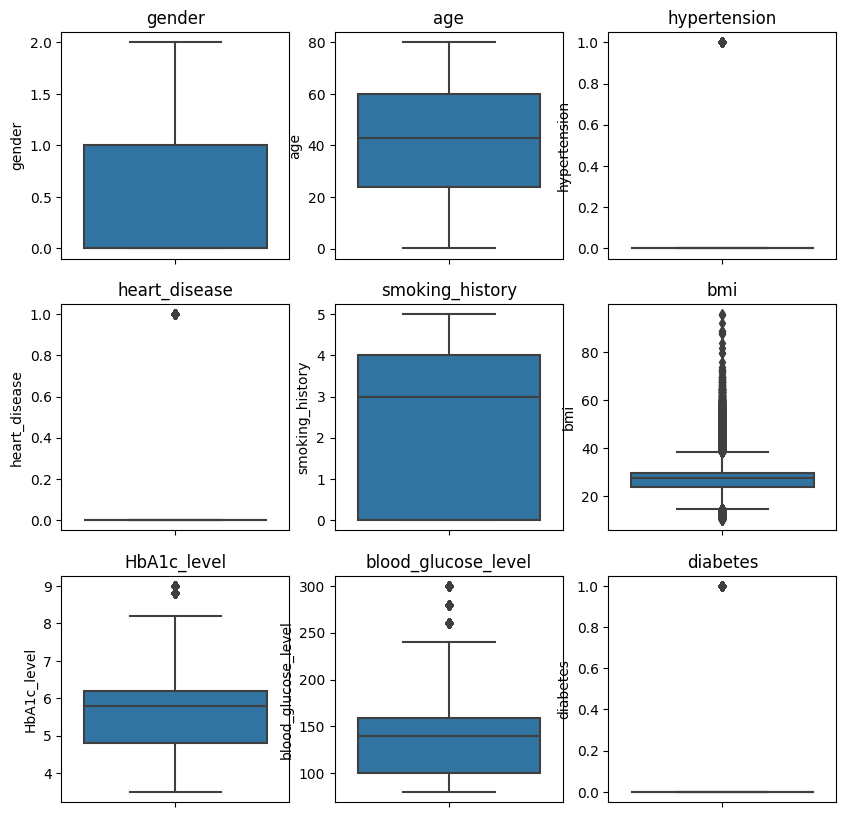

In [7]:
col = df.select_dtypes(include=np.number).columns

plt.figure(figsize=(10, 10))
for i, col in enumerate(col):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.show()

In [8]:
data = ['age', 'bmi', 'HbA1c_level', 'blood_glucose_level']
for col in data:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lw = Q1 - 1.5 * IQR
    up = Q3 + 1.5* IQR
    df = df[(df[col] >= lw) & (df[col] <= up)]

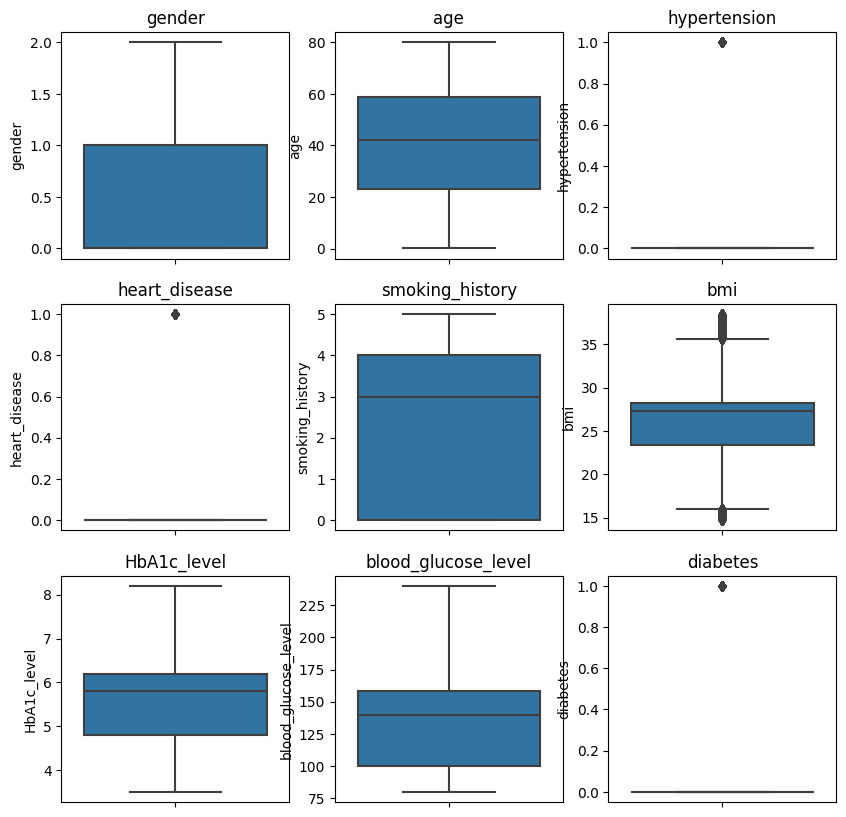

In [9]:
col = df.select_dtypes(include=np.number).columns

plt.figure(figsize=(10, 10))
for i, col in enumerate(col):
    plt.subplot(3, 3, i + 1)
    sns.boxplot(y=df[col])
    plt.title(col)
plt.show()

# **2-EDA** implementation

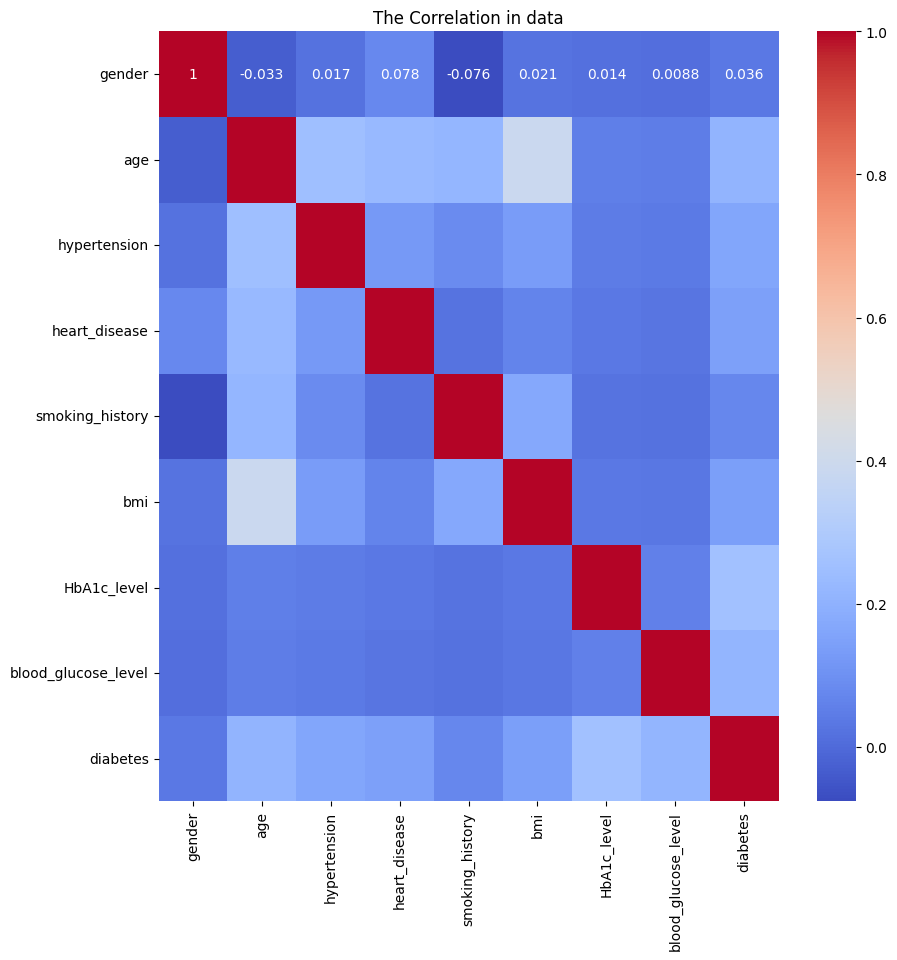

In [10]:
plt.figure(figsize=(10, 10))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('The Correlation in data')
plt.show()

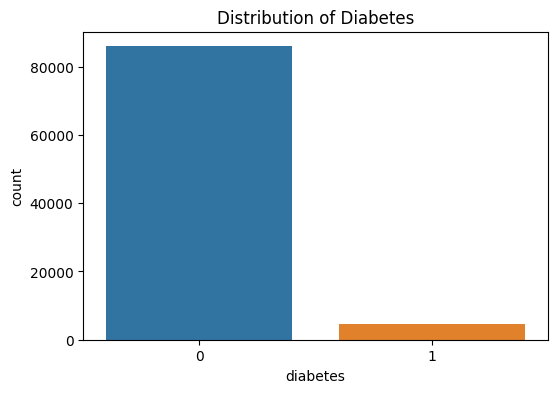

In [11]:
plt.figure(figsize=(6, 4))
sns.countplot(x='diabetes', data=df)
plt.title('Distribution of Diabetes')
plt.show()

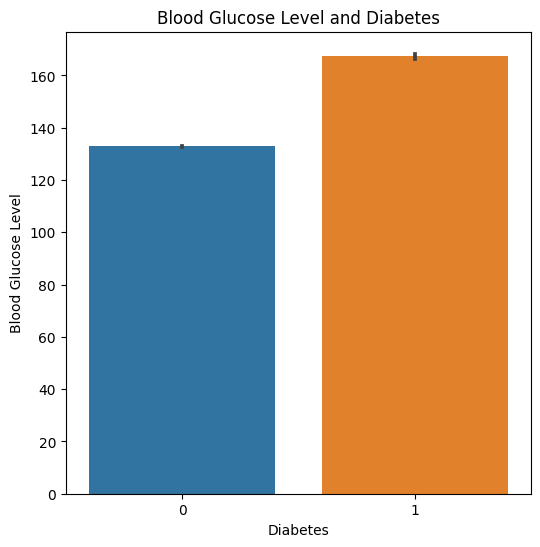

In [12]:
plt.figure(figsize=(6, 6))
sns.barplot(x='diabetes', y='blood_glucose_level', data=df)
plt.title('Blood Glucose Level and Diabetes')
plt.xlabel('Diabetes')
plt.ylabel('Blood Glucose Level')
plt.show()

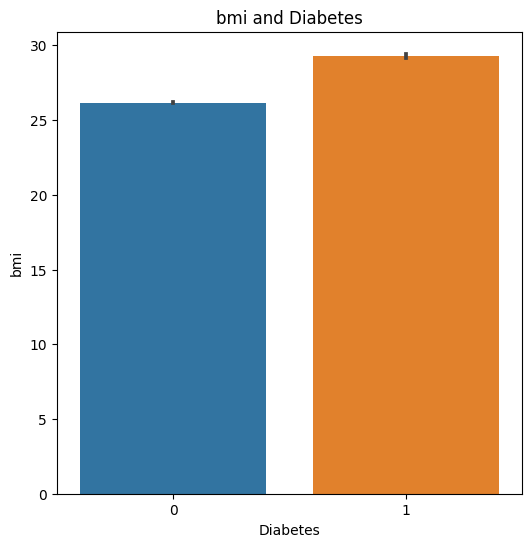

In [13]:
plt.figure(figsize=(6, 6))
sns.barplot(x='diabetes', y='bmi', data=df)
plt.title('bmi and Diabetes')
plt.xlabel('Diabetes')
plt.ylabel('bmi')
plt.show()

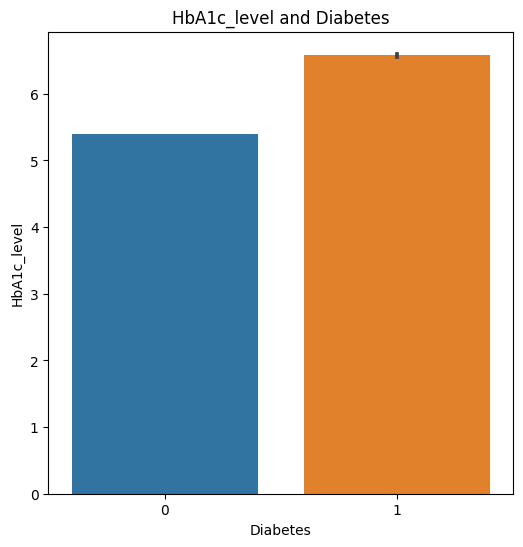

In [14]:
plt.figure(figsize=(6, 6))
sns.barplot(x='diabetes', y='HbA1c_level', data=df)
plt.title('HbA1c_level and Diabetes')
plt.xlabel('Diabetes')
plt.ylabel('HbA1c_level')
plt.show()

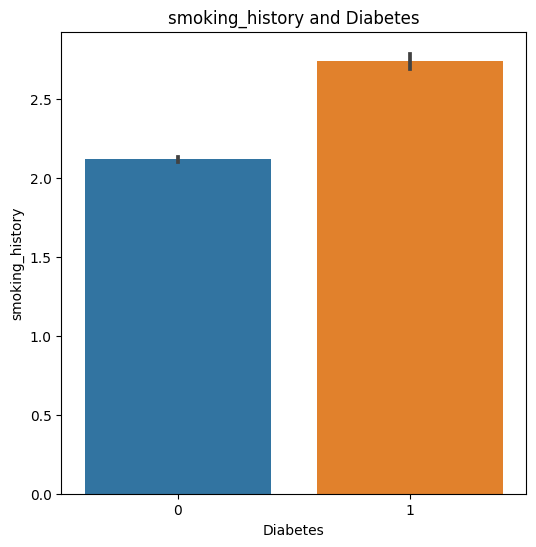

In [15]:
plt.figure(figsize=(6, 6))
sns.barplot(x='diabetes', y='smoking_history', data=df)
plt.title('smoking_history and Diabetes')
plt.xlabel('Diabetes')
plt.ylabel('smoking_history')
plt.show()

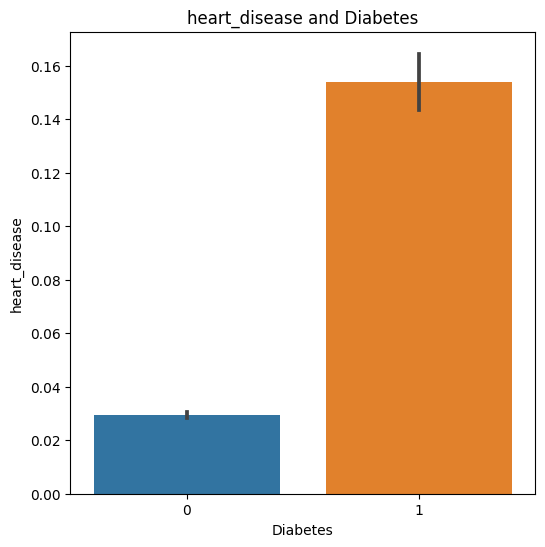

In [16]:
plt.figure(figsize=(6, 6))
sns.barplot(x='diabetes', y='heart_disease', data=df)
plt.title('heart_disease and Diabetes')
plt.xlabel('Diabetes')
plt.ylabel('heart_disease')
plt.show()

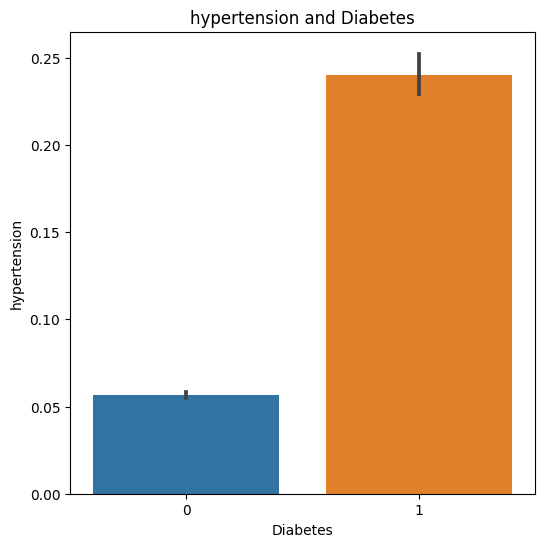

In [17]:
plt.figure(figsize=(6, 6))
sns.barplot(x='diabetes', y='hypertension', data=df)
plt.title('hypertension and Diabetes')
plt.xlabel('Diabetes')
plt.ylabel('hypertension')
plt.show()

# **so**, *there is a strong relation between diabetes and hypertension heart_disease , smoking_history,and HbA1c_level*

# **3**-**feature selection**

In [18]:
x = df.drop('diabetes', axis=1)
y = df['diabetes']

**KNN**

In [19]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score


feature_names = ['gender', 'age', 'hypertension', 'heart_disease',
                 'smoking_history', 'bmi', 'HbA1c_level', 'blood_glucose_level']


x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)


scaler = MinMaxScaler()
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)


knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(x_train_scaled, y_train)

y_pred = knn.predict(x_test_scaled)
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")


Accuracy: 0.9620


/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning

<Figure size 640x480 with 0 Axes>

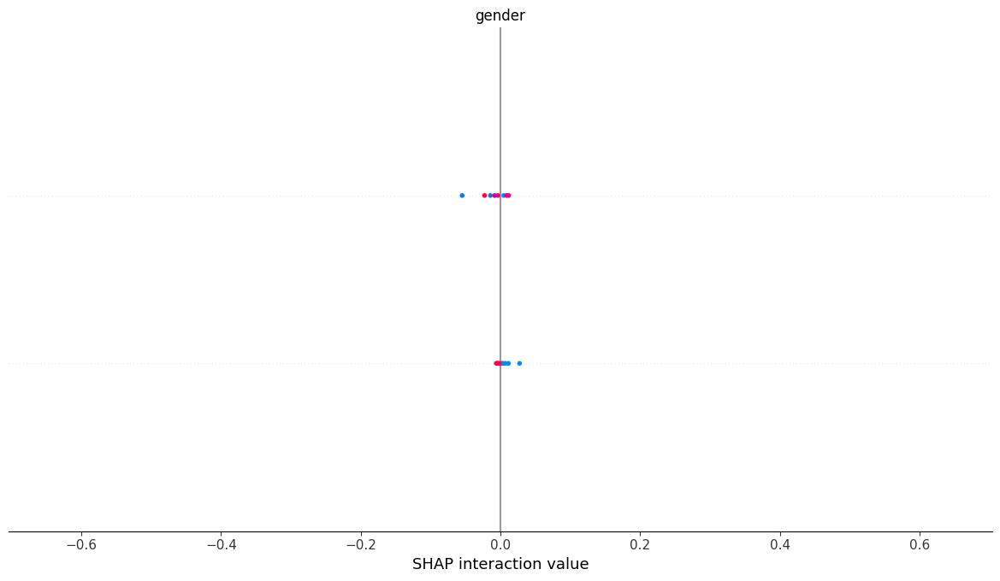

In [37]:
import shap


background = pd.DataFrame(x_train_scaled, columns=feature_names).sample(50, random_state=0)
X_test_df = pd.DataFrame(x_test_scaled, columns=feature_names)

explainer = shap.Explainer(knn.predict_proba, background)
shap_values = explainer(X_test_df.iloc[:8])

shap.summary_plot(shap_values, X_test_df.iloc[:8])
plt.show()


In [35]:



import lime
import lime.lime_tabular


lime_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train_scaled),
    feature_names=feature_names,
    class_names=['No Diabetes', 'Diabetes'],
    mode='classification'
)


for i in range(5):
    print(f"--- Explanation for Sample {i} ---")
    exp = lime_explainer.explain_instance(
        data_row=x_test_scaled[i],
        predict_fn=knn.predict_proba
    )
    exp.show_in_notebook()


--- Explanation for Sample 0 ---


--- Explanation for Sample 1 ---


--- Explanation for Sample 2 ---


--- Explanation for Sample 3 ---


--- Explanation for Sample 4 ---


In [25]:
!pip install artemis
!pip install pyartemis


  Using cached networkx-2.8.8-py3-none-any.whl.metadata (5.1 kB)
Using cached networkx-2.8.8-py3-none-any.whl (2.0 MB)
  Attempting uninstall: networkx
    Found existing installation: networkx 3.4.2
    Uninstalling networkx-3.4.2:
      Successfully uninstalled networkx-3.4.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-image 0.25.2 requires networkx>=3.0, but you have networkx 2.8.8 which is incompatible.
nx-cugraph-cu12 25.2.0 requires networkx>=3.2, but you have networkx 2.8.8 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cuda-cupti-cu12 12.5.82 which

In [27]:
from artemis.interactions_methods.model_agnostic import FriedmanHStatisticMethod
import random

/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but KNeighborsClassifier was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/validation.py:2732: UserWarning

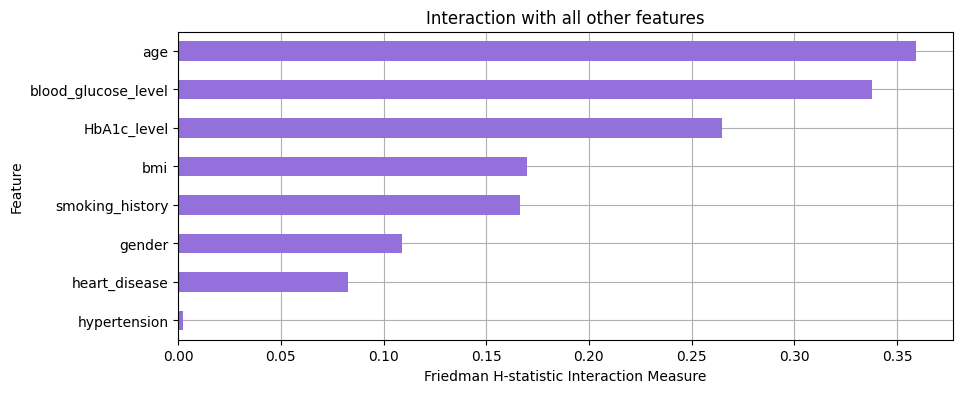

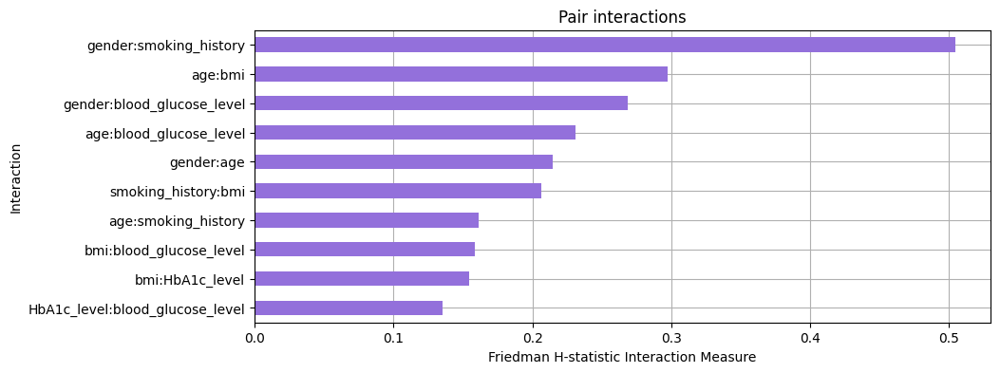

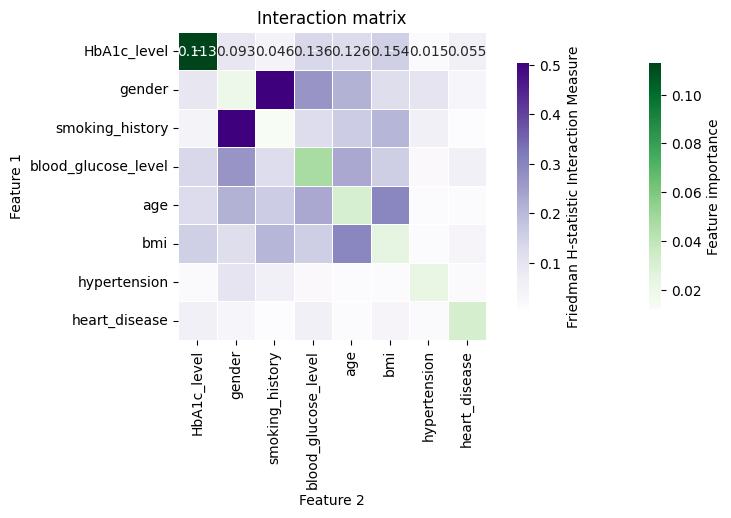

In [28]:
random.seed(8)
X_exp = random.choices(x_train_scaled, k=100)
X_exp = pd.DataFrame(X_exp, columns=feature_names)

h_stat = FriedmanHStatisticMethod()
h_stat.fit(knn, X_exp)


fig, ax = plt.subplots(figsize=(10, 4))
h_stat.plot('bar_chart_ova', ax=ax)


fig, ax = plt.subplots(figsize=(10, 4))
h_stat.plot(vis_type='bar_chart', ax=ax)


fig, ax = plt.subplots(figsize=(10, 4))
h_stat.plot(vis_type='heatmap', ax=ax)

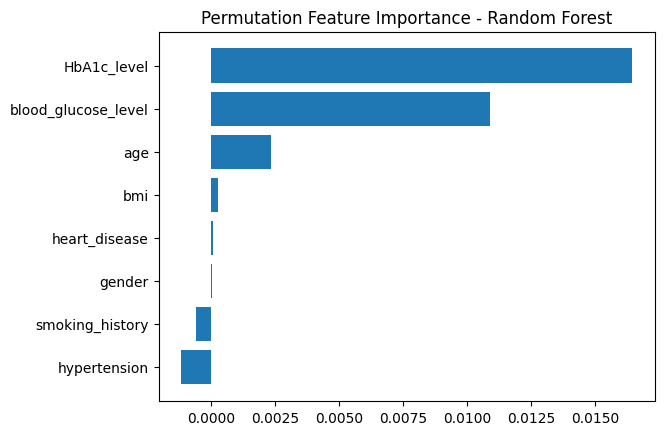

In [33]:
from sklearn.inspection import permutation_importance

result = permutation_importance(knn, x_test_scaled, y_test, n_repeats=10, random_state=42)
sorted_idx = result.importances_mean.argsort()

plt.barh(x.columns[sorted_idx], result.importances_mean[sorted_idx])

plt.title("Permutation Feature Importance - Random Forest")
plt.show()